In [ ]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d shivam2503/diamonds
! unzip diamonds.zip

cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory
Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python2.7/dist-packages/kaggle/__init__.py", line 23, in <module>
    api.authenticate()
  File "/usr/local/lib/python2.7/dist-packages/kaggle/api/kaggle_api_extended.py", line 146, in authenticate
    self.config_file, self.config_dir))
IOError: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method.
unzip:  cannot find or open diamonds.zip, diamonds.zip.zip or diamonds.zip.ZIP.


In [ ]:
# ! pip install -q kaggle
from google.colab import files
files.upload()

Saving diamonds.csv to diamonds.csv


{'diamonds.csv': b'"","carat","cut","color","clarity","depth","table","price","x","y","z"\n"1",0.23,"Ideal","E","SI2",61.5,55,326,3.95,3.98,2.43\n"2",0.21,"Premium","E","SI1",59.8,61,326,3.89,3.84,2.31\n"3",0.23,"Good","E","VS1",56.9,65,327,4.05,4.07,2.31\n"4",0.29,"Premium","I","VS2",62.4,58,334,4.2,4.23,2.63\n"5",0.31,"Good","J","SI2",63.3,58,335,4.34,4.35,2.75\n"6",0.24,"Very Good","J","VVS2",62.8,57,336,3.94,3.96,2.48\n"7",0.24,"Very Good","I","VVS1",62.3,57,336,3.95,3.98,2.47\n"8",0.26,"Very Good","H","SI1",61.9,55,337,4.07,4.11,2.53\n"9",0.22,"Fair","E","VS2",65.1,61,337,3.87,3.78,2.49\n"10",0.23,"Very Good","H","VS1",59.4,61,338,4,4.05,2.39\n"11",0.3,"Good","J","SI1",64,55,339,4.25,4.28,2.73\n"12",0.23,"Ideal","J","VS1",62.8,56,340,3.93,3.9,2.46\n"13",0.22,"Premium","F","SI1",60.4,61,342,3.88,3.84,2.33\n"14",0.31,"Ideal","J","SI2",62.2,54,344,4.35,4.37,2.71\n"15",0.2,"Premium","E","SI2",60.2,62,345,3.79,3.75,2.27\n"16",0.32,"Premium","E","I1",60.9,58,345,4.38,4.42,2.68\n"17",0.3

In [ ]:
#making necessary imports
import plotly.express as px
from plotly.subplots import make_subplots
import cufflinks as cf
import numpy as np
import pandas as pd
import os
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import LabelEncoder
import missingno as msno
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
%matplotlib inline
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from pandas_profiling import ProfileReport
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import mean_squared_error
from sklearn.compose import ColumnTransformer
from sklearn.base import TransformerMixin
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score,precision_score, recall_score,f1_score
from datetime import datetime as dt
from xgboost import XGBRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import plot_importance
from sklearn.model_selection import cross_val_score
pd.set_option('display.max_columns', 500)
import warnings
warnings.filterwarnings("ignore")

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



In [ ]:
import pandas as pd
df = pd.read_csv("diamonds.csv")
df.drop(['Unnamed: 0'], axis=1, inplace=True)

In [ ]:
display(df.shape)
df.head()

(53940, 10)

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [ ]:
df.describe()

,carat,depth,table,price,x,y,z
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,0.797940,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,0.474011,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000
max,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    53940 non-null  float64
 1   cut      53940 non-null  object 
 2   color    53940 non-null  object 
 3   clarity  53940 non-null  object 
 4   depth    53940 non-null  float64
 5   table    53940 non-null  float64
 6   price    53940 non-null  int64  
 7   x        53940 non-null  float64
 8   y        53940 non-null  float64
 9   z        53940 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 4.1+ MB


In [ ]:
ax = sns.pairplot(df)

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75
...,...,...,...,...,...,...,...,...,...,...
53935,0.72,Ideal,D,SI1,60.8,57.0,2757,5.75,5.76,3.50
53936,0.72,Good,D,SI1,63.1,55.0,2757,5.69,5.75,3.61
53937,0.70,Very Good,D,SI1,62.8,60.0,2757,5.66,5.68,3.56
53938,0.86,Premium,H,SI2,61.0,58.0,2757,6.15,6.12,3.74


In [ ]:
num_features = df.select_dtypes(include=['int64', 'float'])
cat_features = df.select_dtypes(include=['object'])

In [ ]:
colors = ['blue', 'red', 'green', 'black', 'brown', 'blue', 'red', 'green', 'black', 'brown']
for num, col in enumerate(num_features.columns):
  fig = px.histogram(x = num_features[col], nbins=50, title='{} distribution'.format(col), marginal='violin', color_discrete_sequence=[colors[num]],
              labels={'x':'{}'.format(col), 'y':'Count'}, width=1000, height=400)
  
  fig.show()

In [ ]:
fig1 = px.histogram(x = cat_features['cut'], nbins=10, marginal='violin', color_discrete_sequence=['red'], width=1000, height=400, labels={'x': 'Cut', 'y': 'Count'})

fig2 = px.histogram(x = cat_features['color'], nbins=10, marginal='violin', color_discrete_sequence=['blue'], width=1000, height=400, labels={'x': 'Cut', 'y': 'Count'})

fig3 = px.histogram(x = cat_features['clarity'], nbins=10, marginal='violin', color_discrete_sequence=['green'], width=1000, height=400, labels={'x': 'Cut', 'y': 'Count'})


fig1.show()
fig2.show()
fig3.show()

In [ ]:
display(cat_features.cut.value_counts())
print(' ')
display(cat_features.color.value_counts())
print(' ')
display(cat_features.clarity.value_counts())


Ideal        21551
Premium      13791
Very Good    12082
Good          4906
Fair          1610
Name: cut, dtype: int64

G    11292
E     9797
F     9542
H     8304
D     6775
I     5422
J     2808
Name: color, dtype: int64

SI1     13065
VS2     12258
SI2      9194
VS1      8171
VVS2     5066
VVS1     3655
IF       1790
I1        741
Name: clarity, dtype: int64

### Diamonds are graded into the following:

•Cut grading

Ideal cut > Premium cut > Very Good (or Fine) cut > Good cut > Fair cut > Poor cut

•Color grading

D > E > F > G > H > I > J

•Clarity grading

IF > VVS1 > VVS2 > VS1 > VS2 > SI1 > SI2 > I1

In [ ]:
# Imputing numbers for ordinal categorical features 
nums_for_imputing = {"cut":     {'Ideal': 5, 'Premium': 4, 'Very Good': 3, 'Good': 2, 'Fair':1},
                "color": {"D": 7, "E": 6, "F": 5, "G": 4, "H": 3, "I": 2, "J":1 },
                "clarity": {"IF": 8, "VVS1": 7, "VVS2": 6, "VS1": 5, "VS2": 4,"SI1": 3, "SI2": 2, "I1":1 }}

In [ ]:
encoded = cat_features.replace(nums_for_imputing)

In [ ]:
df = pd.concat([num_features, encoded], axis=1)
df

,carat,depth,table,price,x,y,z,cut,color,clarity
0,0.23,61.5,55.0,326,3.95,3.98,2.43,5,6,2
1,0.21,59.8,61.0,326,3.89,3.84,2.31,4,6,3
2,0.23,56.9,65.0,327,4.05,4.07,2.31,2,6,5
3,0.29,62.4,58.0,334,4.20,4.23,2.63,4,2,4
4,0.31,63.3,58.0,335,4.34,4.35,2.75,2,1,2
...,...,...,...,...,...,...,...,...,...,...
53935,0.72,60.8,57.0,2757,5.75,5.76,3.50,5,7,3
53936,0.72,63.1,55.0,2757,5.69,5.75,3.61,2,7,3
53937,0.70,62.8,60.0,2757,5.66,5.68,3.56,3,7,3
53938,0.86,61.0,58.0,2757,6.15,6.12,3.74,4,3,2


In [ ]:
# Unsupervised feature selection
# Applying correlation analysis without the target value
X, y = df.iloc[:,[0,1,2,4,5,6,7,8,9]], df.iloc[:,[3]]
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)


In [ ]:
from sklearn.preprocessing import scale
X_train_scaled = scale(X_train)
cov = np.cov(X_train_scaled, rowvar=False)

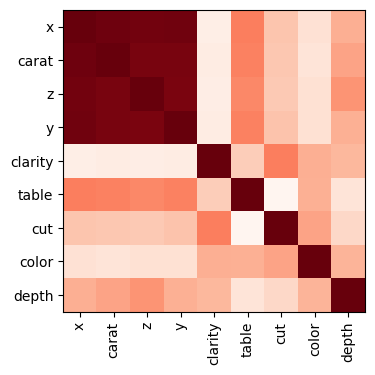

In [ ]:
order = np.argsort(np.linalg.norm(cov,axis=1))[::-1]

plt.figure(figsize=(4, 4), dpi=100)
plt.imshow(cov[order, :][:, order],cmap='Reds')
plt.xticks(range(X.shape[1]), X.columns[order], rotation=90)
plt.yticks(range(X.shape[1]), X.columns[order])
plt.show()

### Carat, x, y, and z attributes are highly correlated with each other. We remove the x, y, and z attributes and keep the carat attribute.

In [ ]:
# Dropping x,y, and z features
df = df.drop(['x','y','z'],axis=1)

In [ ]:
# Applying correlation analysis with the target value
pcorr = df.corr(method='pearson')
pcorr.loc["price"]

carat      0.921591
depth     -0.010647
table      0.127134
price      1.000000
cut       -0.053491
color     -0.172511
clarity   -0.146800
Name: price, dtype: float64

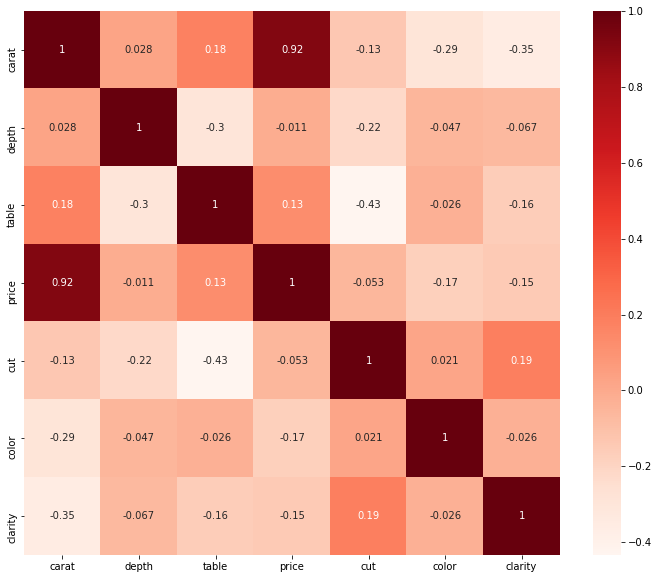

In [ ]:
plt.figure(figsize=(12,10))
sns.heatmap(pcorr, annot=True, cmap=plt.cm.Reds)
plt.show()

### The carat attribute seems to be highly correlated with the target value. It shows that the price of diamonds increases as they grow in size. Let's leave it there.

In [ ]:
# encoded = cat_features.apply(LabelEncoder().fit_transform)
# df = pd.concat([num_features, encoded], axis=1)

df_original = df.copy()
#Using 2.5 as a threshold. We can exclude 0.025% of data.
z = np.abs(stats.zscore(df))
df = df[(z < 2.5).all(axis=1)]

In [ ]:
df_original.shape, df.shape

((53940, 7), (48670, 7))

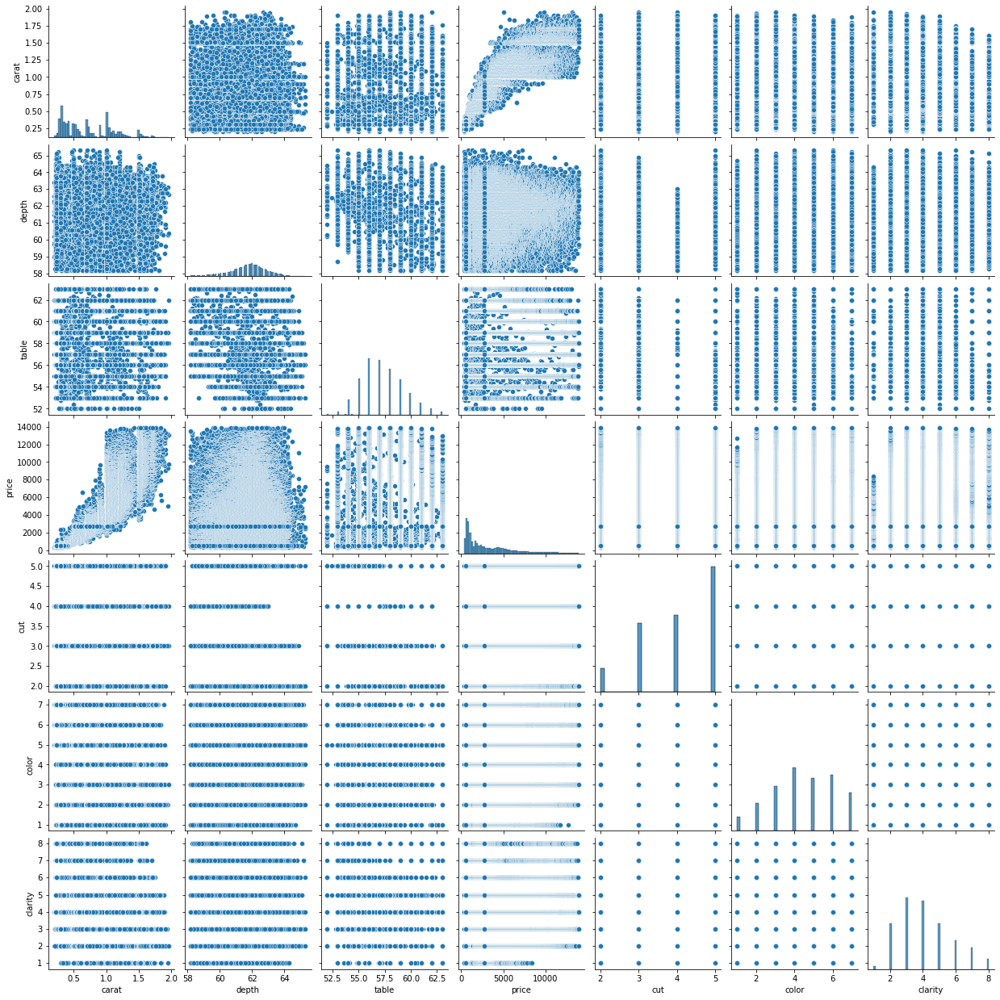

In [ ]:
ax = sns.pairplot(df)

In [ ]:
# corr = df.corr()
# mask = np.zeros_like(corr)
# mask[np.triu_indices_from(mask)] = True
# with sns.axes_style("white"):
#     f, ax = plt.subplots(figsize=(7, 5))
#     ax = sns.heatmap(corr, mask=mask, vmax=1.0, vmin=-1.0)

# Using the entire data set, 53940 instances

In [ ]:
X = df_original.drop(["price"],axis =1)
y = df_original["price"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [ ]:
pipeline_lr=Pipeline([("scalar1",StandardScaler()),
                     ("lr_classifier",LinearRegression())])

pipeline_dt=Pipeline([("scalar2",StandardScaler()),
                     ("dt_classifier",DecisionTreeRegressor())])

pipeline_rf=Pipeline([("scalar3",StandardScaler()),
                     ("rf_classifier",RandomForestRegressor())])


pipeline_kn=Pipeline([("scalar4",StandardScaler()),
                     ("rf_classifier",KNeighborsRegressor())])


pipeline_xgb=Pipeline([("scalar5",StandardScaler()),
                     ("rf_classifier",XGBRegressor())])

pipelines = [pipeline_lr, pipeline_dt, pipeline_rf, pipeline_kn, pipeline_xgb]

In [ ]:
for pipe in pipelines:
  print(pipe)
  pipe.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('scalar1',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('lr_classifier',
                 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
                                  normalize=False))],
         verbose=False)
Pipeline(memory=None,
         steps=[('scalar2',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('dt_classifier',
                 DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse',
                                       max_depth=None, max_features=None,
                                       max_leaf_nodes=None,
                                       min_impurity_decrease=0.0,
                                       min_impurity_split=None,
                                       min_samples_leaf=1, min_samples_split=2,
                                       min_weight_fraction_leaf=0.0,
                                      

In [ ]:
cv_r2 = []
for i, model in enumerate(pipelines):
    cv = cross_val_score(model, X_train,y_train,scoring="r2", cv=10)
    cv_r2.append(cv)

print('r2-LinearRegression', cv_r2[0].mean())
print('r2-DecisionTree', cv_r2[1].mean())
print('r2-RandomForest', cv_r2[2].mean())
print('r2-KNeighbors', cv_r2[3].mean())
print('r2-XGBRegressor', cv_r2[4].mean())

[23:59:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:59:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:59:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:59:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:59:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:59:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:59:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[23:59:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

In [ ]:
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300]
}

rf = RandomForestRegressor()

grid_search = make_pipeline(StandardScaler(), GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3))

grid_search.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('gridsearchcv',
                 GridSearchCV(cv=3, error_score=nan,
                              estimator=RandomForestRegressor(bootstrap=True,
                                                              ccp_alpha=0.0,
                                                              criterion='mse',
                                                              max_depth=None,
                                                              max_features='auto',
                                                              max_leaf_nodes=None,
                                                              max_samples=None,
                                                              min_impurity_decrease=0.0,
                                                              min_impurity_split=None...
                                             

In [ ]:
y_pred = grid_search.predict(X_test)

In [ ]:
r2_score(y_test, y_pred)

0.9818838298198658

# Using the outliers removed data set, 48670 instances(90% of the original data)

In [ ]:
X = df.drop(["price"],axis =1)
y = df["price"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [ ]:
pipeline_lr=Pipeline([("scalar1",StandardScaler()),
                     ("lr_classifier",LinearRegression())])

pipeline_dt=Pipeline([("scalar2",StandardScaler()),
                     ("dt_classifier",DecisionTreeRegressor())])

pipeline_rf=Pipeline([("scalar3",StandardScaler()),
                     ("rf_classifier",RandomForestRegressor())])


pipeline_kn=Pipeline([("scalar4",StandardScaler()),
                     ("rf_classifier",KNeighborsRegressor())])


pipeline_xgb=Pipeline([("scalar5",StandardScaler()),
                     ("rf_classifier",XGBRegressor())])

pipelines = [pipeline_lr, pipeline_dt, pipeline_rf, pipeline_kn, pipeline_xgb]

In [ ]:
for pipe in pipelines:
  print(pipe)
  pipe.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('scalar1',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('lr_classifier',
                 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
                                  normalize=False))],
         verbose=False)
Pipeline(memory=None,
         steps=[('scalar2',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('dt_classifier',
                 DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse',
                                       max_depth=None, max_features=None,
                                       max_leaf_nodes=None,
                                       min_impurity_decrease=0.0,
                                       min_impurity_split=None,
                                       min_samples_leaf=1, min_samples_split=2,
                                       min_weight_fraction_leaf=0.0,
                                      

In [ ]:
cv_r2 = []
for i, model in enumerate(pipelines):
    cv = cross_val_score(model, X_train,y_train,scoring="r2", cv=10)
    cv_r2.append(cv)

print('r2-LinearRegression', cv_r2[0].mean())
print('r2-DecisionTree', cv_r2[1].mean())
print('r2-RandomForest', cv_r2[2].mean())
print('r2-KNeighbors', cv_r2[3].mean())
print('r2-XGBRegressor', cv_r2[4].mean())

[04:25:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[04:25:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[04:25:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[04:25:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[04:25:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[04:25:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[04:25:18] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[04:25:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

In [ ]:
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300]
}

rf = RandomForestRegressor()

grid_search = make_pipeline(StandardScaler(), GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3))

grid_search.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('gridsearchcv',
                 GridSearchCV(cv=3, error_score=nan,
                              estimator=RandomForestRegressor(bootstrap=True,
                                                              ccp_alpha=0.0,
                                                              criterion='mse',
                                                              max_depth=None,
                                                              max_features='auto',
                                                              max_leaf_nodes=None,
                                                              max_samples=None,
                                                              min_impurity_decrease=0.0,
                                                              min_impurity_split=None...
                                             

In [ ]:
y_pred = grid_search.predict(X_test)

In [ ]:
r2_score(y_test, y_pred)

0.9829972106613734

Project Proposal
alternative way: cast price into different bins, classificaiton problem, then for different price class, have different regressor estimation

# Classification by using DBSCAN

In [ ]:
#resetting index
df_new_index = df.reset_index(drop=True)

X = df_new_index.drop(["price"],axis =1)
y = df_new_index["price"]
X.columns

Index(['carat', 'depth', 'table', 'cut', 'color', 'clarity'], dtype='object')

In [ ]:
# Scaling X
from sklearn.preprocessing import MinMaxScaler
min_max_scaler = MinMaxScaler()
X[['carat', 'depth', 'table', 'cut', 'color', 'clarity']] = min_max_scaler.fit_transform(X[['carat', 'depth', 'table', 'cut', 'color', 'clarity']])


In [ ]:
# DBSCAN

from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps=0.3333333, min_samples=5)
dbscan.fit(X)

DBSCAN(algorithm='auto', eps=0.3333333, leaf_size=30, metric='euclidean',
       metric_params=None, min_samples=5, n_jobs=None, p=None)

In [ ]:
# We have 5 clusters but the -1 cluster is a collection of outliers.
np.unique(dbscan.labels_)

array([-1,  0,  1,  2,  3])

In [ ]:
predict = pd.DataFrame(dbscan.fit_predict(X))



In [ ]:
predict.columns = ['label']

In [ ]:
# concatenating labels to X and y as a new column
labeled_df = pd.concat([X,predict,y],axis=1)

In [ ]:
labeled_df

,carat,depth,table,cut,color,clarity,label,price
0,0.017045,0.464789,0.272727,1.000000,0.833333,0.142857,0,326
1,0.005682,0.225352,0.818182,0.666667,0.833333,0.285714,1,326
2,0.051136,0.591549,0.545455,0.666667,0.166667,0.428571,1,334
3,0.062500,0.718310,0.545455,0.000000,0.000000,0.142857,2,335
4,0.022727,0.647887,0.454545,0.333333,0.000000,0.714286,3,336
...,...,...,...,...,...,...,...,...
48665,0.295455,0.366197,0.454545,1.000000,1.000000,0.285714,0,2757
48666,0.295455,0.690141,0.272727,0.000000,1.000000,0.285714,2,2757
48667,0.284091,0.647887,0.727273,0.333333,1.000000,0.285714,3,2757
48668,0.375000,0.394366,0.545455,0.666667,0.333333,0.142857,1,2757


In [ ]:
# Checking # of instances of each cluster

for i in np.unique(dbscan.labels_):
  if i == -1:
    print("Outliers")
    print(labeled_df[labeled_df["label"] == i])
  else:
    print("The shape of Cluster", i)
    print(labeled_df[labeled_df["label"] == i].shape)

Outliers
          carat     depth     table  cut  color   clarity  label  price
11953  0.517045  0.014085  0.909091  0.0    0.0  1.000000     -1   5361
21806  0.914773  0.098592  0.272727  0.0    0.5  0.142857     -1  11336
The shape of Cluster 0
(20711, 8)
The shape of Cluster 1
(12633, 8)
The shape of Cluster 2
(3941, 8)
The shape of Cluster 3
(11383, 8)


In [ ]:
from sklearn.decomposition import PCA


labeled_X = labeled_df[['carat', 'depth', 'table', 'cut', 'color', 'clarity']] # It's scaled.
labeled_y = labeled_df['label']

#performing PCA to reduce the number of features to 2
pca = PCA(2)
 
#Transform the data
X_pca_scaled = pca.fit_transform(labeled_X)

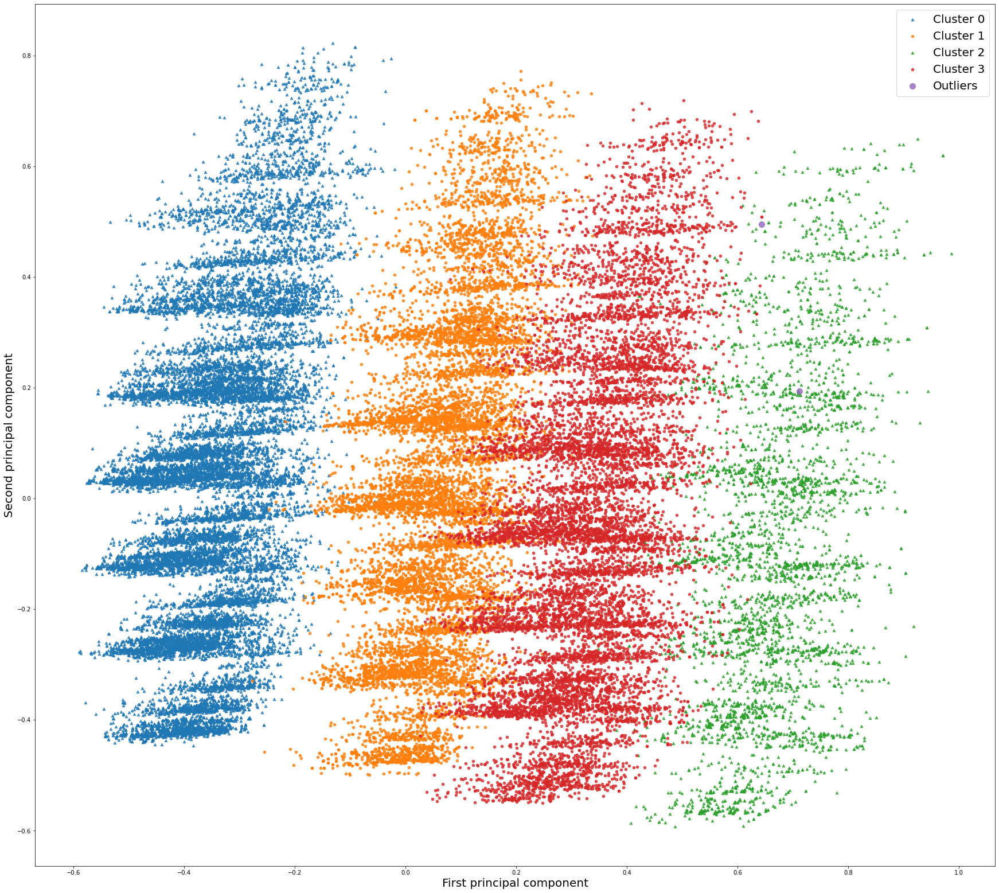

In [ ]:
# the visualization of PCA using top two principal components
plt.figure(figsize = (30,30))
plt.scatter(X_pca_scaled[labeled_y==0, 0], X_pca_scaled[labeled_y==0, 1], 
            marker = '^', alpha=.8, label = 'Cluster 0', s=20)
plt.scatter(X_pca_scaled[labeled_y==1, 0], X_pca_scaled[labeled_y==1, 1], 
            marker = 'o', alpha=.8, label = 'Cluster 1', s=20)
plt.scatter(X_pca_scaled[labeled_y==2, 0], X_pca_scaled[labeled_y==2, 1], 
            marker = '^', alpha=.8, label = 'Cluster 2', s=20)
plt.scatter(X_pca_scaled[labeled_y==3, 0], X_pca_scaled[labeled_y==3, 1], 
            marker = 'o', alpha=.8, label = 'Cluster 3', s=20)
plt.scatter(X_pca_scaled[labeled_y==-1, 0], X_pca_scaled[labeled_y==-1, 1], 
            marker = 'o', alpha=.8, label = 'Outliers', s=100)
plt.gca().set_aspect("equal")
plt.xlabel("First principal component", fontsize = 20)
plt.ylabel("Second principal component", fontsize = 20)
plt.legend(loc='best', fontsize = 20)
plt.show()

## We can observe separations among clusters. There are overlaps between cluster 1 and cluster 3. Let's find the proper predictive model for each cluster.

In [ ]:
# Building pipelines
pipeline_lr=Pipeline([("scalar1",StandardScaler()),
                     ("lr_classifier",LinearRegression())])

pipeline_dt=Pipeline([("scalar2",StandardScaler()),
                     ("dt_classifier",DecisionTreeRegressor())])

pipeline_rf=Pipeline([("scalar3",StandardScaler()),
                     ("rf_classifier",RandomForestRegressor())])


pipeline_kn=Pipeline([("scalar4",StandardScaler()),
                     ("rf_classifier",KNeighborsRegressor())])


pipeline_xgb=Pipeline([("scalar5",StandardScaler()),
                     ("rf_classifier",XGBRegressor())])

pipelines = [pipeline_lr, pipeline_dt, pipeline_rf, pipeline_kn, pipeline_xgb]

In [ ]:
# Applying Linear Regression, Decision Tree, Random Forest, kNN, and XGB Regression on each cluster
# Getting r2 scores to see performance of each model
for i in range(4):
  print("==================================================")
  print("==================================================")
  print("The cluster ", i)
  cluster = labeled_df[labeled_df["label"] == i]
  X = cluster.drop(["price","label"],axis =1)
  y = cluster["price"]
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
  for pipe in pipelines:
    pipe.fit(X_train, y_train)
  cv_r2 = []
  for i, model in enumerate(pipelines):
      cv = cross_val_score(model, X_train,y_train,scoring="r2", cv=10)
      cv_r2.append(cv)

  print('r2-LinearRegression', cv_r2[0].mean())
  print('r2-DecisionTree', cv_r2[1].mean())
  print('r2-RandomForest', cv_r2[2].mean())
  print('r2-KNeighbors', cv_r2[3].mean())
  print('r2-XGBRegressor', cv_r2[4].mean())

The cluster  0
[01:18:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated

## For all clusters, the Random Forest algorithm showed the best performance.

In [ ]:
# Hyperparameter tuning for Random Forest Algorithm
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300]
}

rf = RandomForestRegressor()

grid_search = make_pipeline(StandardScaler(), GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3))

In [ ]:
for i in range(4):
  print("==================================================")
  print("==================================================")
  print("The cluster ", i)
  cluster = labeled_df[labeled_df["label"] == i]
  X = cluster.drop(["price","label"],axis =1)
  y = cluster["price"]
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

  grid_search.fit(X_train, y_train)
  y_pred = grid_search.predict(X_test)
  print(r2_score(y_test, y_pred))

The cluster  0
0.9826922665904866
The cluster  1
0.9786934635935912
The cluster  2
0.9668097365997053
The cluster  3
0.9838775860950318


## The r2 score of the Random Forest Algorithm for the whole data set was 0.9829972106613734. 

## Cluster 0 has a similar r2 score. But clusters 1 and 2 have lower r2 scores. Cluster 3 shows the best performance but cluster 3 only contains 21% of the whole data.

# Creating two clusters using DBSCAN as a outlier detector

In [ ]:
# DBSCAN

from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps=1/3, min_samples=2)
dbscan.fit(X)

DBSCAN(algorithm='auto', eps=0.3333333333333333, leaf_size=30,
       metric='euclidean', metric_params=None, min_samples=2, n_jobs=None,
       p=None)

In [ ]:
# We have 3 clusters but the -1 cluster is a collection of outliers.
np.unique(dbscan.labels_)

array([-1,  0,  1])

In [ ]:
predict = pd.DataFrame(dbscan.fit_predict(X))
predict.columns = ['label']

# concatenating labels to X and y as a new column
labeled_df = pd.concat([X,predict,y],axis=1)

In [ ]:
# Checking # of instances of each cluster

for i in np.unique(dbscan.labels_):
  if i == -1:
    print("Outliers")
    print(labeled_df[labeled_df["label"] == i])
  else:
    print("The shape of Cluster", i)
    print(labeled_df[labeled_df["label"] == i].shape)

Outliers
          carat     depth     table  cut  color  clarity  label  price
11953  0.517045  0.014085  0.909091  0.0    0.0      1.0     -1   5361
The shape of Cluster 0
(44727, 8)
The shape of Cluster 1
(3942, 8)


In [ ]:
from sklearn.decomposition import PCA


labeled_X = labeled_df[['carat', 'depth', 'table', 'cut', 'color', 'clarity']] # It's scaled.
labeled_y = labeled_df['label']

#performing PCA to reduce the number of features to 2
pca = PCA(2)
 
#Transform the data
X_pca_scaled = pca.fit_transform(labeled_X)

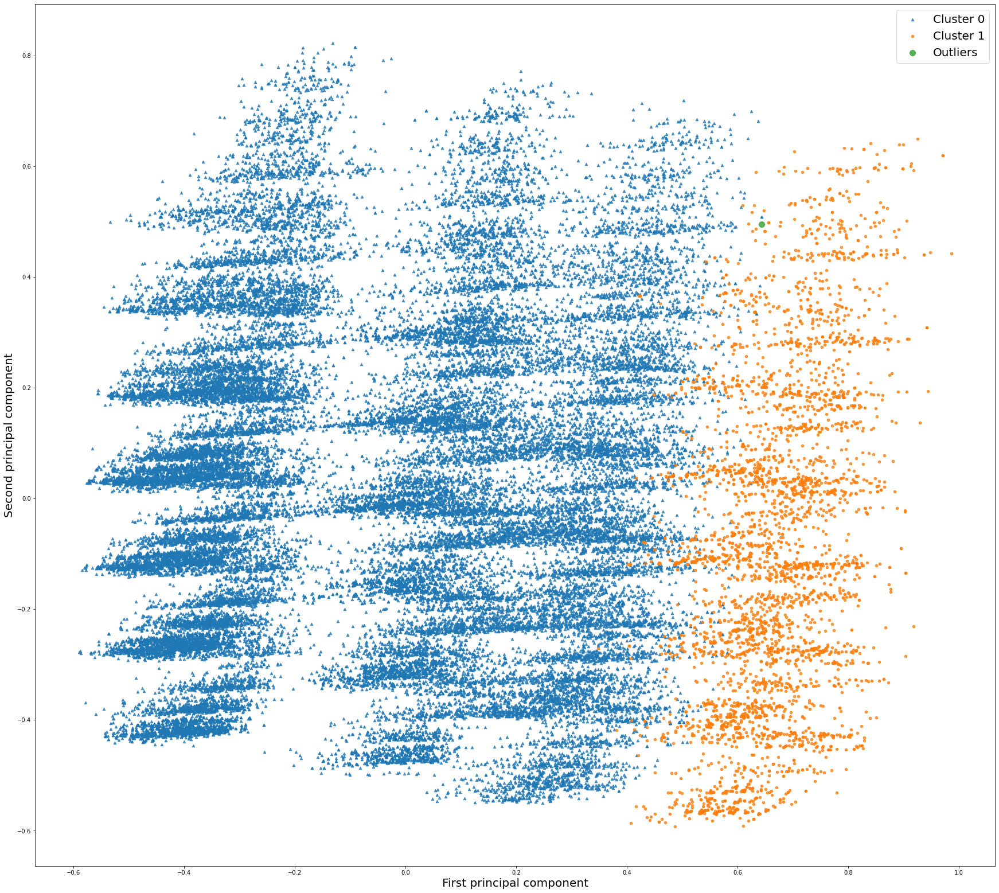

In [ ]:
# the visualization of PCA using top two principal components
plt.figure(figsize = (30,30))
plt.scatter(X_pca_scaled[labeled_y==0, 0], X_pca_scaled[labeled_y==0, 1], 
            marker = '^', alpha=.8, label = 'Cluster 0', s=20)
plt.scatter(X_pca_scaled[labeled_y==1, 0], X_pca_scaled[labeled_y==1, 1], 
            marker = 'o', alpha=.8, label = 'Cluster 1', s=20)
plt.scatter(X_pca_scaled[labeled_y==-1, 0], X_pca_scaled[labeled_y==-1, 1], 
            marker = 'o', alpha=.8, label = 'Outliers', s=100)
plt.gca().set_aspect("equal")
plt.xlabel("First principal component", fontsize = 20)
plt.ylabel("Second principal component", fontsize = 20)
plt.legend(loc='best', fontsize = 20)
plt.show()

## There are some overlaps between cluster 0 and cluster 1. Cluster 1 seems to be very similar the cluster 2 of previous PCA plotting. Let's find the proper predictive model for each cluster. Then let's determine to treat this cluster 1 as outliers or not.

In [ ]:
# Building pipelines
pipeline_lr=Pipeline([("scalar1",StandardScaler()),
                     ("lr_classifier",LinearRegression())])

pipeline_dt=Pipeline([("scalar2",StandardScaler()),
                     ("dt_classifier",DecisionTreeRegressor())])

pipeline_rf=Pipeline([("scalar3",StandardScaler()),
                     ("rf_classifier",RandomForestRegressor())])


pipeline_kn=Pipeline([("scalar4",StandardScaler()),
                     ("rf_classifier",KNeighborsRegressor())])


pipeline_xgb=Pipeline([("scalar5",StandardScaler()),
                     ("rf_classifier",XGBRegressor())])

pipelines = [pipeline_lr, pipeline_dt, pipeline_rf, pipeline_kn, pipeline_xgb]

In [ ]:
# Applying Linear Regression, Decision Tree, Random Forest, kNN, and XGB Regression on each cluster
# Getting r2 scores to see performance of each model
for i in range(2):
  print("==================================================")
  print("==================================================")
  print("The cluster ", i)
  cluster = labeled_df[labeled_df["label"] == i]
  X = cluster.drop(["price","label"],axis =1)
  y = cluster["price"]
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
  for pipe in pipelines:
    pipe.fit(X_train, y_train)
  cv_r2 = []
  for i, model in enumerate(pipelines):
      cv = cross_val_score(model, X_train,y_train,scoring="r2", cv=10)
      cv_r2.append(cv)

  print('r2-LinearRegression', cv_r2[0].mean())
  print('r2-DecisionTree', cv_r2[1].mean())
  print('r2-RandomForest', cv_r2[2].mean())
  print('r2-KNeighbors', cv_r2[3].mean())
  print('r2-XGBRegressor', cv_r2[4].mean())

The cluster  0
[22:45:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:46:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:46:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:46:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:46:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:46:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:46:44] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:46:45] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated

In [ ]:
# Hyperparameter tuning for Random Forest Algorithm
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300]
}

rf = RandomForestRegressor()

grid_search = make_pipeline(StandardScaler(), GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3))

In [ ]:
for i in range(2):
  print("==================================================")
  print("==================================================")
  print("The cluster ", i)
  cluster = labeled_df[labeled_df["label"] == i]
  X = cluster.drop(["price","label"],axis =1)
  y = cluster["price"]
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

  grid_search.fit(X_train, y_train)
  y_pred = grid_search.predict(X_test)
  print(r2_score(y_test, y_pred))

The cluster  0
0.983870009266275
The cluster  1
0.9703744368458357



## The best r2 score, so far, was 0.9838775860950318 of previous Cluster 3 with 11383 instances.
## The r2 score of cluster 0 is 0.983870009266275, which is very close to the best r2 score. However, this cluster 0 holds 83% of the whole data. Previous cluster 3 only contains 21% of the entire data. In this case, we can see that DBSCAN can be used as outlier detection.
